In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

import importlib
from libs import preps, plots, params, feats, strats
importlib.reload(preps)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strats)

<module 'libs.strats' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strats.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

,open,high,low,close,volume,trade_count,vwap,ask,bid,ret,log_ret,sma_5,sma_pct_5,sma_9,sma_pct_9,sma_21,sma_pct_21,sma_50,sma_pct_50,sma_100,sma_pct_100,sma_200,sma_pct_200,ema_9,ema_21,ema_50,roc_5,roc_10,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,rsi_14,rsi_21,macd_line_6_13_5,macd_signal_6_13_5,macd_diff_6_13_5,macd_line_12_26_9,macd_signal_12_26_9,macd_diff_12_26_9,atr_7,atr_pct_7,atr_14,atr_pct_14,atr_28,atr_pct_28,plus_di_7,minus_di_7,adx_7,plus_di_14,minus_di_14,adx_14,plus_di_28,minus_di_28,adx_28,bb_lband_20_2p0,bb_hband_20_2p0,bb_w_20_2p0,bb_lband_20_3p0,bb_hband_20_3p0,bb_w_20_3p0,bb_lband_50_2p0,bb_hband_50_2p0,bb_w_50_2p0,obv,vol_spike_7,vol_spike_14,vol_spike_28,rolling_max_close_200,rolling_min_close_200,dist_high_200,dist_low_200,obv_diff_7,obv_pct_7,obv_diff_21,obv_pct_21,ret_std_21,ret_std_63,stoch_k_14_3_3,stoch_d_14_3_3,stoch_k_9_3_3,stoch_d_9_3_3,cci_14,cci_20,mfi_14,mfi_20,cmf_14,cmf_20,donch_h_20,donch_l_20,donch_w_20,donch_h_55,donch_l_55,donch_w_55,roll_vwap_20,roll_vwap_50,slope_close_20,slope_close_50,kc_mid_20_20_1.5,kc_l_20_20_1.5,kc_h_20_20_1.5,kc_w_20_20_1.5,kc_mid_20_20_2.0,kc_l_20_20_2.0,kc_h_20_20_2.0,kc_w_20_20_2.0,psar,psar_dir,vwap_ohlc_close_session
2021-09-01 08:00:00,152.340,152.400,152.200,152.310,2052.0,79.0,152.343289,152.3405,152.2795,0.002633,0.002630,151.956,0.002330,151.911111,0.002626,151.874286,0.002869,151.8499,0.003030,151.862701,0.002945,151.874676,0.002866,151.953148,151.894996,151.867887,0.002963,0.003095,0.003161,-0.03,-0.000197,0.06,0.11,0.001313,97.117392,92.108647,88.907688,0.072060,0.027698,0.044362,0.043925,0.012360,0.031565,0.093550,0.000614,0.053679,0.000352,0.031763,0.000209,84.467536,3.401602,28.421520,77.491111,7.239535,19.072892,69.968105,11.638923,14.391505,151.674268,152.077732,0.002657,151.573401,152.178599,0.003985,151.714905,151.984895,0.001778,1.529217e+10,0.613270,1.023843,1.224605,152.31,151.82,0.000000,0.003217,19082.0,125.599677,27680.000000,182.256001,0.000579,0.000339,84.482759,94.827586,84.482759,94.827586,466.666667,657.602451,85.708219,81.744827,0.262026,0.233686,152.400000,151.82,0.003808,152.400,151.80,0.003939,151.889248,151.866828,0.007699,0.001677,151.897444,151.836322,151.958567,0.000805,151.897444,151.815948,151.978941,0.001073,151.820000,1,152.310000
2021-09-01 08:01:00,152.310,152.310,152.310,152.310,1163.0,12.0,152.310000,152.3405,152.2795,0.000000,0.000000,152.048,0.001723,151.961111,0.002296,151.896667,0.002721,151.8593,0.002968,151.866702,0.002919,151.876876,0.002852,152.024518,151.932724,151.885225,0.003029,0.003095,0.003095,0.00,0.000000,0.00,0.00,0.000000,97.117392,92.108647,88.907688,0.106679,0.054025,0.052654,0.071035,0.024095,0.046941,0.080186,0.000526,0.049844,0.000327,0.030628,0.000201,84.467536,3.401602,37.540956,77.491111,7.239535,23.632803,69.968105,11.638923,16.430226,151.624973,152.175027,0.003621,151.487459,152.312541,0.005432,151.672758,152.045842,0.002457,1.529217e+10,0.376288,0.576864,0.696184,152.31,151.82,0.000000,0.003217,17295.0,113.788242,26841.000000,176.705655,0.000579,0.000339,84.482759,89.655172,84.482759,89.655172,235.338654,336.051648,85.801987,86.061612,0.295809,0.278437,152.400000,151.82,0.003808,152.400,151.80,0.003939,151.905092,151.875656,0.013173,0.002735,151.936735,151.878669,151.994802,0.000764,151.936735,151.859314,152.014157,0.001019,151.820000,1,152.310000
2021-09-01 08:02:00,152.300,152.300,152.300,152.300,900.0,32.5,152.300000,152.3305,152.2695,-0.000066,-0.000066,152.138,0.001065,152.011111,0.001900,151.919048,0.002508,151.8687,0.002840,151.870602,0.002827,151.879026,0.002772,152.079614,151.966113,151.901491,0.002963,0.002897,0.003096,0.00,0.000000,0.00,0.00,0.000000,94.266696,90.188784,87.281932,0.122091,0.076714,0.045377,0.090669,0.037410,0.053259,0.070159,0.000461,0.046998,0.000309,0.029892,0.000196,82.747626,5.368519,44.722948,76.313395,8.649316,27.633299,69.132130,12.694655,18.306713,151.598286,152.246714,0.004268,151.436178,152.408822,0.006402,151.645288,152.092112,0.0029

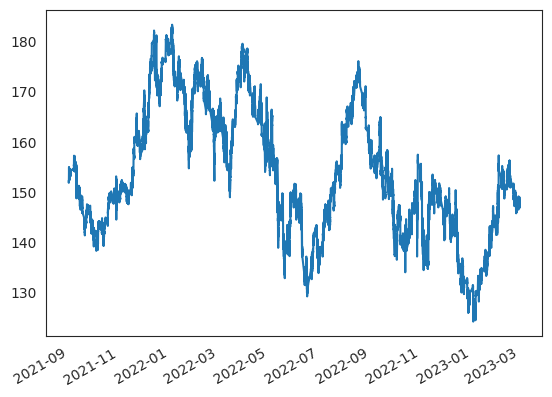

In [3]:
# Read the unscaled indicators dataframe

df = pd.read_csv(params.indunsc_csv, index_col=0, parse_dates=True) # indunsc_test_csv
df = df[(df.index >= '2021-09-01') & (df.index < '2023-03-01')] #########################
df.close.plot()
df

In [4]:
col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick

if col_signal == 'signal_raw' and sign_thresh == 'signal_thresh': # running simulation for the target signal
    print('building signals directly into df...')
    df = preps.build_signal_per_day( 
            df              = df, 
            min_prof_thr    = params.min_prof_thr_tick,
            max_down_prop   = params.max_down_prop_tick,
            gain_tightfact  = params.gain_tightfact_tick,
            tau_time        = params.tau_time_tick,
            tau_dur         = params.tau_dur_tick,
            thresh_mode     = params.thresh_mode_tick,
            thresh_window   = params.thresh_window_tick,
    )

first_day = df.index.normalize().min()
start_ask = df.loc[df.index.normalize() == first_day, "ask"].iloc[0]
strats.reset_globals(start_ask)

sim_results = {}
groups = df.groupby(df.index.normalize())
total_days = df.index.normalize().nunique()


for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strats.generate_actions_alpaca(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = params.col_atr_tick,
        col_adx         = params.col_adx_tick,
        col_rsi         = params.col_rsi_tick,
        col_vwap        = params.col_vwap_tick,
        reset_peak      = params.reset_peak_tick,
        rsi_min_thresh  = params.rsi_min_thresh_tick,
        rsi_max_thresh  = params.rsi_max_thresh_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        adx_thresh      = params.adx_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        sess_start      = params.sess_premark
    )
    
    sim_results.update(
        strats.simulate_trading(
            day         = day,
            df          = df_actions,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/375 [00:00<?, ?it/s]

Loop finished. Days simulated: 375


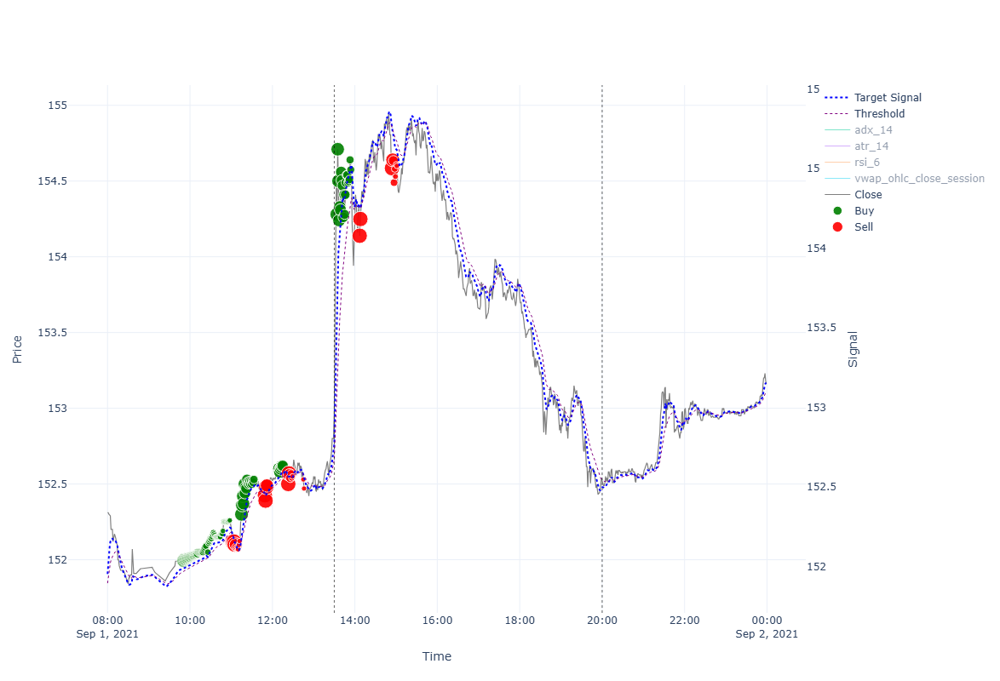


                                                  ******* Performance for 2021-09-01 *******

INTRADAY:
  shares(653); [ask_buy=153.011, fee_buy=0.004, pos_amnt_buy=99918.534]; [bid_sell=152.489, fee_sell=0.018, pos_amnt_sell=99564.215]; leftover=81.466; PNL=-354.318
TRADES:
  Tr[1]: Time(09:51)Ask(152.025)Bid(151.965)Act(Buy)Shrs(34)Pos(34); CashTr(-5169.0)=Cost(-5168.864)-Fee(-0.136); P&L(99997.797)=CashTot(94831.0)+PosAmt(5166.796)
  Tr[2]: Time(09:52)Ask(152.03)Bid(151.97)Act(Buy)Shrs(32)Pos(66); CashTr(-4865.101)=Cost(-4864.973)-Fee(-0.128); P&L(99995.893)=CashTot(89965.9)+PosAmt(10029.994)
  Tr[3]: Time(09:53)Ask(152.033)Bid(151.972)Act(Buy)Shrs(30)Pos(96); CashTr(-4561.095)=Cost(-4560.975)-Fee(-0.12); P&L(99994.088)=CashTot(85404.804)+PosAmt(14589.284)
  Tr[4]: Time(09:54)Ask(152.035)Bid(151.974)Act(Buy)Shrs(29)Pos(125); CashTr(-4409.12)=Cost(-4409.004)-Fee(-0.116); P&L(99992.411)=CashTot(80995.685)+PosAmt(18996.726)
  Tr[5]: Time(09:55)Ask(152.037)Bid(151.976)Act(Buy)Shrs(27)P

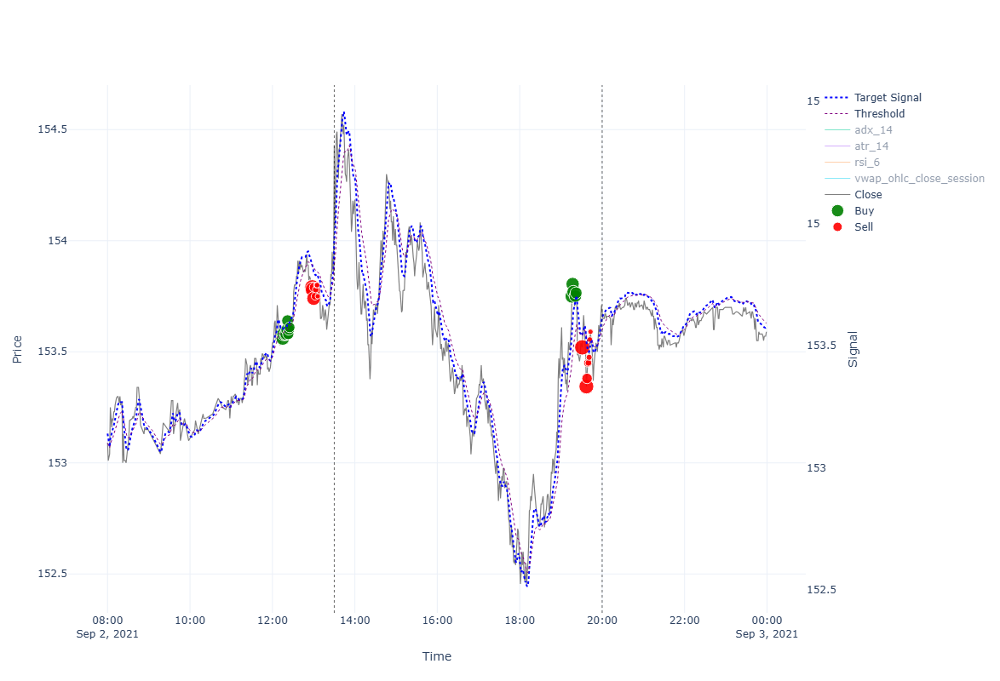


                                                  ******* Performance for 2021-09-02 *******

INTRADAY:
  shares(645); [ask_buy=154.461, fee_buy=0.004, pos_amnt_buy=99629.86]; [bid_sell=153.649, fee_sell=0.018, pos_amnt_sell=99092.493]; leftover=15.821; PNL=-537.367
TRADES:
  Tr[1]: Time(12:15)Ask(153.591)Bid(153.529)Act(Buy)Shrs(33)Pos(33); CashTr(-5068.625)=Cost(-5068.493)-Fee(-0.132); P&L(99824.69)=CashTot(94758.223)+PosAmt(5066.467)
  Tr[2]: Time(12:16)Ask(153.611)Bid(153.549)Act(Buy)Shrs(32)Pos(65); CashTr(-4915.67)=Cost(-4915.542)-Fee(-0.128); P&L(99823.257)=CashTot(89842.553)+PosAmt(9980.704)
  Tr[3]: Time(12:19)Ask(153.61)Bid(153.548)Act(Buy)Shrs(30)Pos(95); CashTr(-4608.411)=Cost(-4608.291)-Fee(-0.12); P&L(99821.23)=CashTot(85234.142)+PosAmt(14587.089)
  Tr[4]: Time(12:20)Ask(153.611)Bid(153.549)Act(Buy)Shrs(29)Pos(124); CashTr(-4454.826)=Cost(-4454.71)-Fee(-0.116); P&L(99819.429)=CashTot(80779.315)+PosAmt(19040.113)
  Tr[5]: Time(12:21)Ask(153.631)Bid(153.569)Act(Buy)Shrs(27

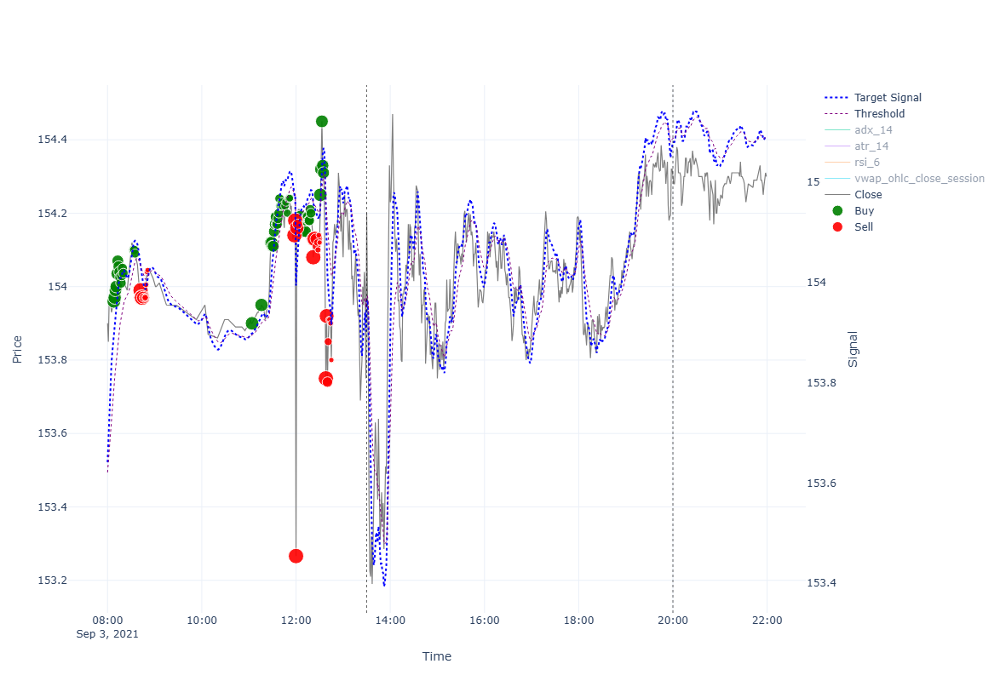


                                                  ******* Performance for 2021-09-03 *******

INTRADAY:
  shares(642); [ask_buy=154.231, fee_buy=0.004, pos_amnt_buy=99018.742]; [bid_sell=154.269, fee_sell=0.018, pos_amnt_sell=99029.5]; leftover=89.573; PNL=10.759
TRADES:
  Tr[1]: Time(08:08)Ask(153.991)Bid(153.929)Act(Buy)Shrs(34)Pos(34); CashTr(-5235.823)=Cost(-5235.687)-Fee(-0.136); P&L(99789.273)=CashTot(94555.681)+PosAmt(5233.593)
  Tr[2]: Time(08:09)Ask(154.001)Bid(153.939)Act(Buy)Shrs(32)Pos(66); CashTr(-4928.154)=Cost(-4928.026)-Fee(-0.128); P&L(99787.514)=CashTot(89627.527)+PosAmt(10159.987)
  Tr[3]: Time(08:10)Ask(154.021)Bid(153.959)Act(Buy)Shrs(30)Pos(96); CashTr(-4620.744)=Cost(-4620.624)-Fee(-0.12); P&L(99786.866)=CashTot(85006.783)+PosAmt(14780.083)
  Tr[4]: Time(08:11)Ask(154.031)Bid(153.969)Act(Buy)Shrs(29)Pos(125); CashTr(-4467.009)=Cost(-4466.893)-Fee(-0.116); P&L(99785.924)=CashTot(80539.774)+PosAmt(19246.15)
  Tr[5]: Time(08:12)Ask(154.066)Bid(154.004)Act(Buy)Shrs(

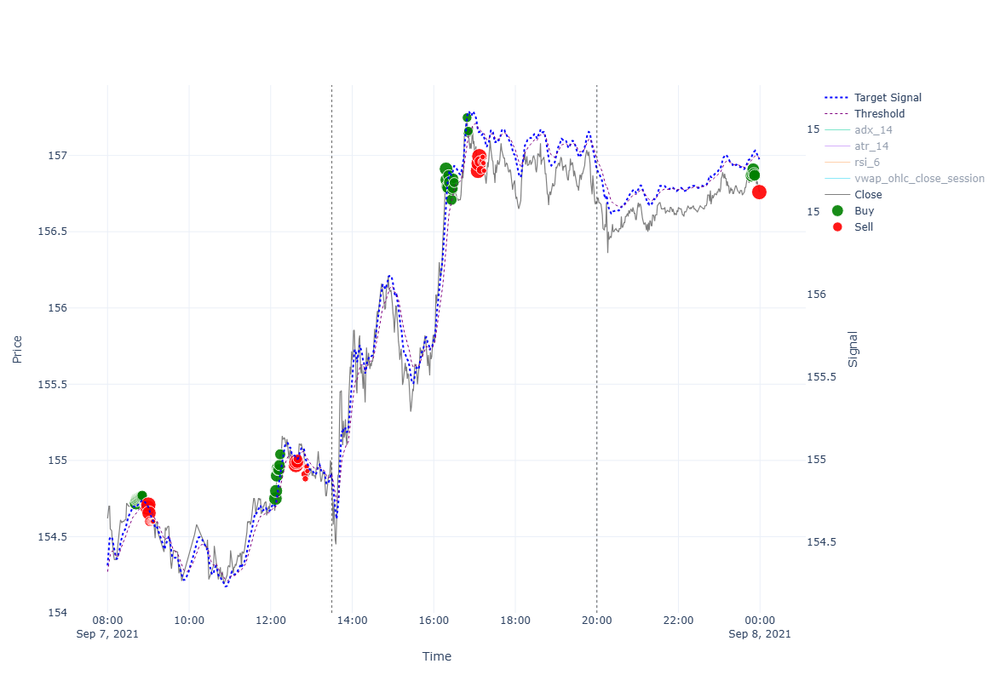


                                                  ******* Performance for 2021-09-07 *******

INTRADAY:
  shares(640); [ask_buy=154.861, fee_buy=0.004, pos_amnt_buy=99113.6]; [bid_sell=156.659, fee_sell=0.018, pos_amnt_sell=100250.306]; leftover=5.473; PNL=1136.706
TRADES:
  Tr[1]: Time(08:42)Ask(154.751)Bid(154.689)Act(Buy)Shrs(33)Pos(33); CashTr(-5106.912)=Cost(-5106.78)-Fee(-0.132); P&L(99514.835)=CashTot(94410.094)+PosAmt(5104.74)
  Tr[2]: Time(08:43)Ask(154.771)Bid(154.709)Act(Buy)Shrs(31)Pos(64); CashTr(-4798.022)=Cost(-4797.898)-Fee(-0.124); P&L(99513.455)=CashTot(89612.073)+PosAmt(9901.382)
  Tr[3]: Time(08:44)Ask(154.775)Bid(154.713)Act(Buy)Shrs(30)Pos(94); CashTr(-4643.36)=Cost(-4643.24)-Fee(-0.12); P&L(99511.719)=CashTot(84968.713)+PosAmt(14543.007)
  Tr[4]: Time(08:45)Ask(154.778)Bid(154.717)Act(Buy)Shrs(28)Pos(122); CashTr(-4333.908)=Cost(-4333.796)-Fee(-0.112); P&L(99510.227)=CashTot(80634.805)+PosAmt(18875.422)
  Tr[5]: Time(08:46)Ask(154.782)Bid(154.72)Act(Buy)Shrs(27)

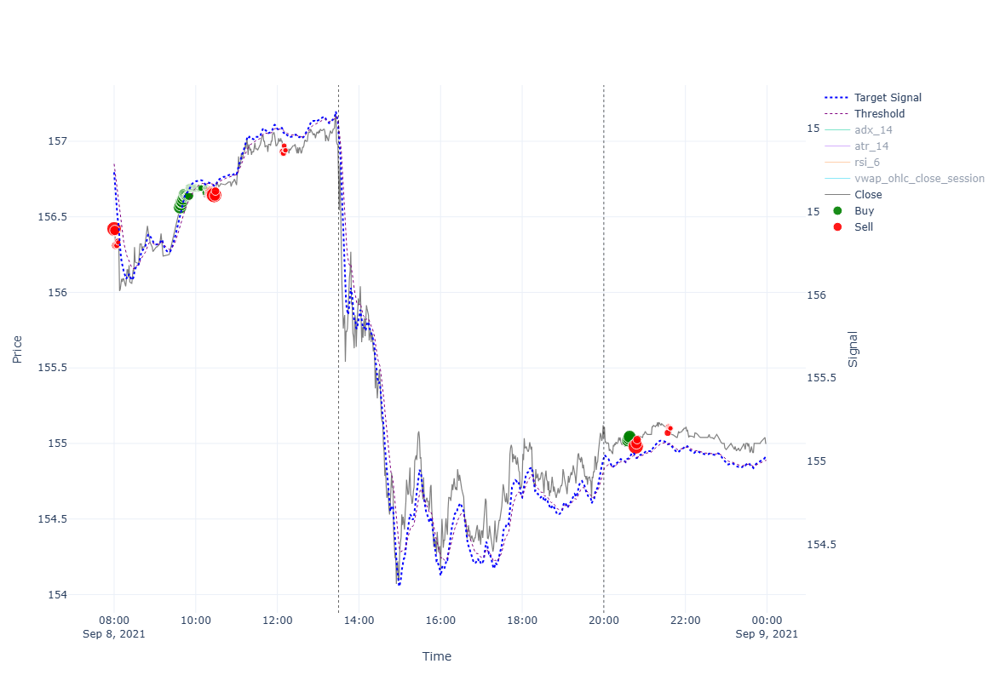


                                                  ******* Performance for 2021-09-08 *******

INTRADAY:
  shares(639); [ask_buy=156.731, fee_buy=0.004, pos_amnt_buy=100153.857]; [bid_sell=155.009, fee_sell=0.018, pos_amnt_sell=99039.531]; leftover=101.923; PNL=-1114.326
TRADES:
  Tr[1]: Time(08:00)Ask(156.451)Bid(156.389)Act(Sell)Shrs(37)Pos(44); CashTr(5785.731)=Cost(5786.382)-Fee(-0.651); P&L(99406.797)=CashTot(92525.694)+PosAmt(6881.103)
  Tr[2]: Time(08:01)Ask(156.441)Bid(156.379)Act(Sell)Shrs(20)Pos(24); CashTr(3127.222)=Cost(3127.574)-Fee(-0.352); P&L(99406.005)=CashTot(95652.916)+PosAmt(3753.089)
  Tr[3]: Time(08:02)Ask(156.341)Bid(156.279)Act(Sell)Shrs(11)Pos(13); CashTr(1718.872)=Cost(1719.066)-Fee(-0.193); P&L(99403.411)=CashTot(97371.788)+PosAmt(2031.623)
  Tr[4]: Time(08:03)Ask(156.341)Bid(156.279)Act(Sell)Shrs(6)Pos(7); CashTr(937.567)=Cost(937.672)-Fee(-0.106); P&L(99403.306)=CashTot(98309.355)+PosAmt(1093.951)
  Tr[5]: Time(08:04)Ask(156.341)Bid(156.279)Act(Sell)Shrs(4)

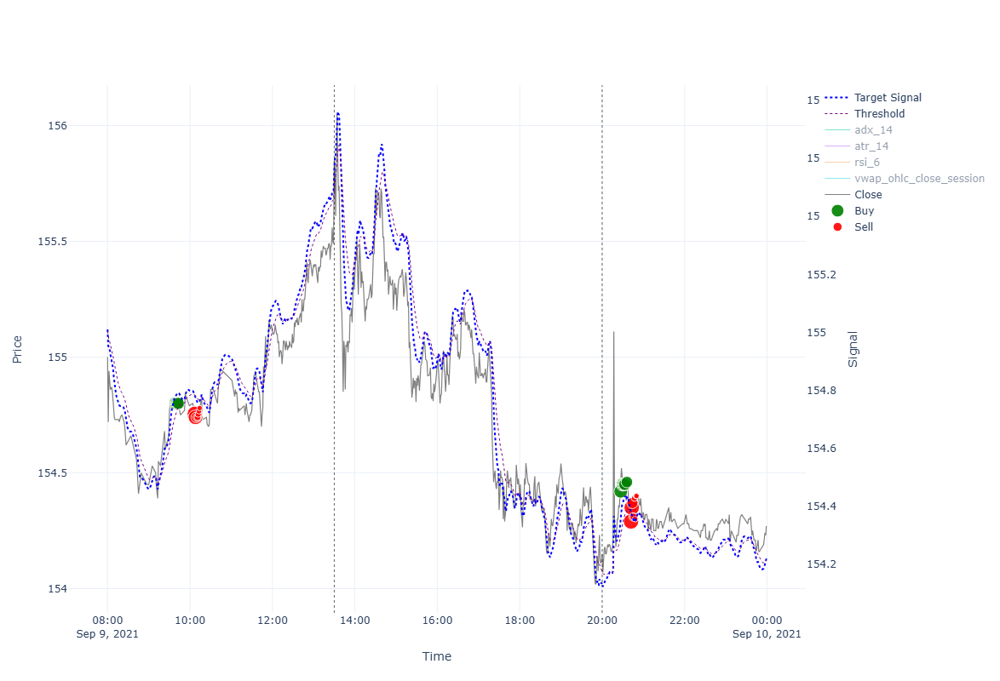


                                                  ******* Performance for 2021-09-09 *******

INTRADAY:
  shares(635); [ask_buy=155.881, fee_buy=0.004, pos_amnt_buy=98987.102]; [bid_sell=154.119, fee_sell=0.018, pos_amnt_sell=97854.555]; leftover=154.352; PNL=-1132.547
TRADES:
  Tr[1]: Time(09:39)Ask(154.831)Bid(154.769)Act(Buy)Shrs(33)Pos(33); CashTr(-5109.555)=Cost(-5109.423)-Fee(-0.132); P&L(99352.705)=CashTot(94245.328)+PosAmt(5107.377)
  Tr[2]: Time(09:40)Ask(154.831)Bid(154.769)Act(Buy)Shrs(31)Pos(64); CashTr(-4799.885)=Cost(-4799.761)-Fee(-0.124); P&L(99350.659)=CashTot(89445.443)+PosAmt(9905.216)
  Tr[3]: Time(09:41)Ask(154.831)Bid(154.769)Act(Buy)Shrs(30)Pos(94); CashTr(-4645.05)=Cost(-4644.93)-Fee(-0.12); P&L(99348.679)=CashTot(84800.393)+PosAmt(14548.286)
  Tr[4]: Time(09:42)Ask(154.831)Bid(154.769)Act(Buy)Shrs(28)Pos(122); CashTr(-4335.38)=Cost(-4335.268)-Fee(-0.112); P&L(99346.831)=CashTot(80465.013)+PosAmt(18881.818)
  Tr[5]: Time(09:43)Ask(154.831)Bid(154.769)Act(Buy)Sh

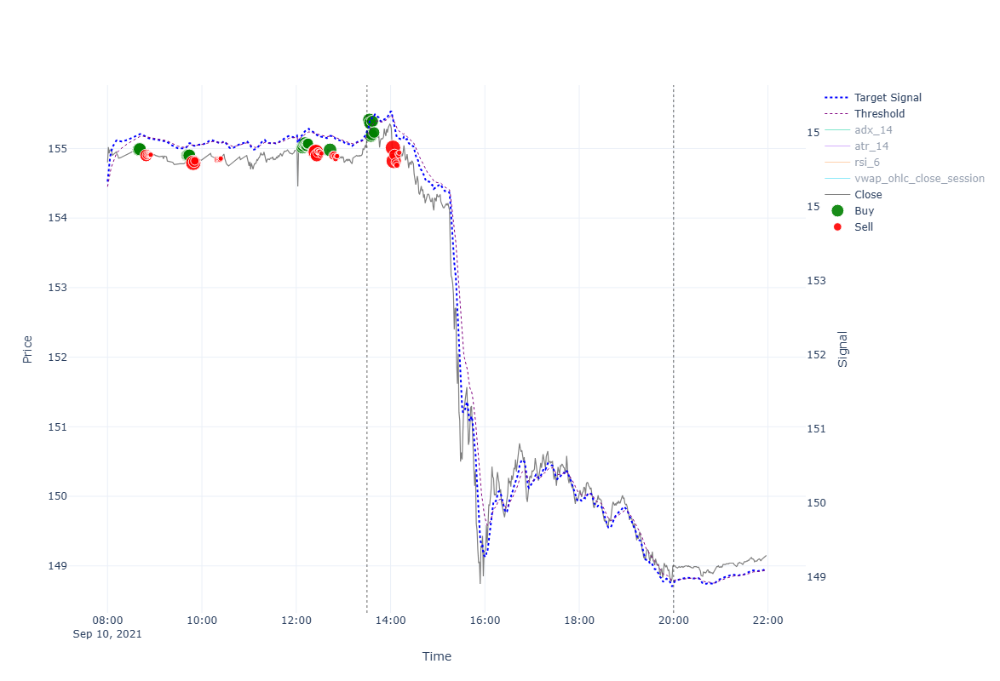


                                                  ******* Performance for 2021-09-10 *******

INTRADAY:
  shares(631); [ask_buy=155.23, fee_buy=0.004, pos_amnt_buy=97952.528]; [bid_sell=148.97, fee_sell=0.017, pos_amnt_sell=93989.204]; leftover=56.379; PNL=-3963.324
TRADES:
  Tr[1]: Time(08:40)Ask(155.018)Bid(154.956)Act(Buy)Shrs(33)Pos(33); CashTr(-5115.715)=Cost(-5115.583)-Fee(-0.132); P&L(99296.196)=CashTot(94182.659)+PosAmt(5113.537)
  Tr[2]: Time(08:41)Ask(155.021)Bid(154.959)Act(Buy)Shrs(31)Pos(64); CashTr(-4805.775)=Cost(-4805.651)-Fee(-0.124); P&L(99294.26)=CashTot(89376.884)+PosAmt(9917.376)
  Tr[3]: Time(08:49)Ask(154.931)Bid(154.869)Act(Sell)Shrs(29)Pos(35); CashTr(4490.692)=Cost(4491.201)-Fee(-0.509); P&L(99287.991)=CashTot(93867.576)+PosAmt(5420.415)
  Tr[4]: Time(08:50)Ask(154.936)Bid(154.874)Act(Sell)Shrs(16)Pos(19); CashTr(2477.703)=Cost(2477.984)-Fee(-0.281); P&L(99287.885)=CashTot(96345.279)+PosAmt(2942.606)
  Tr[5]: Time(08:51)Ask(154.941)Bid(154.879)Act(Sell)Shrs(9

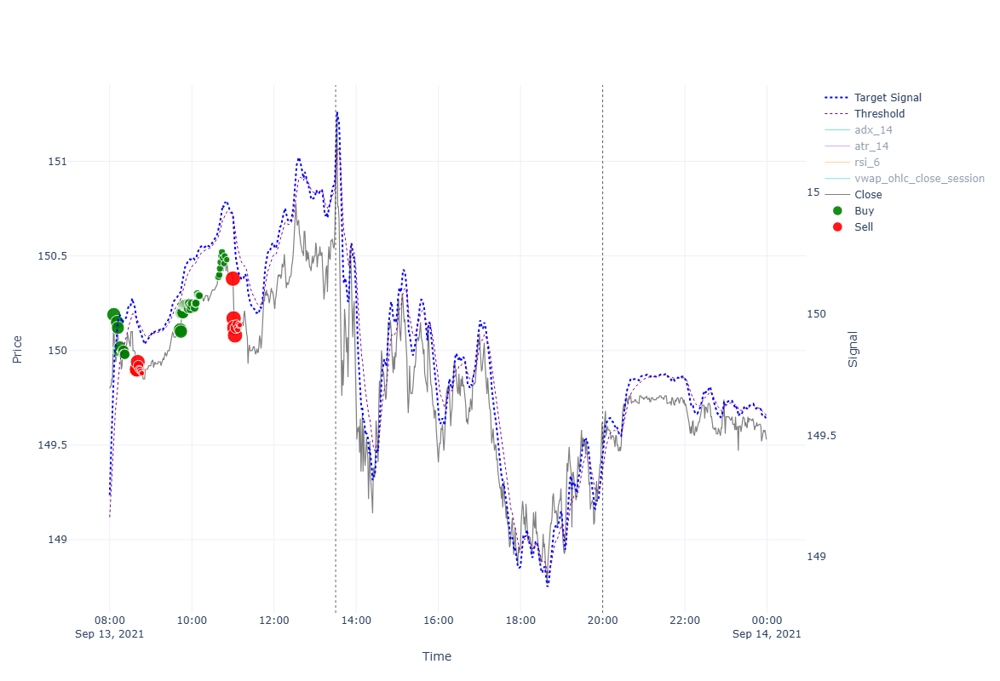


                                                  ******* Performance for 2021-09-13 *******

INTRADAY:
  shares(623); [ask_buy=150.91, fee_buy=0.004, pos_amnt_buy=94019.547]; [bid_sell=149.46, fee_sell=0.017, pos_amnt_sell=93102.782]; leftover=26.036; PNL=-916.764
TRADES:
  Tr[1]: Time(08:06)Ask(150.22)Bid(150.16)Act(Buy)Shrs(35)Pos(35); CashTr(-5257.84)=Cost(-5257.7)-Fee(-0.14); P&L(99139.092)=CashTot(93883.492)+PosAmt(5255.6)
  Tr[2]: Time(08:11)Ask(150.18)Bid(150.12)Act(Buy)Shrs(33)Pos(68); CashTr(-4956.072)=Cost(-4955.94)-Fee(-0.132); P&L(99135.58)=CashTot(88927.42)+PosAmt(10208.16)
  Tr[3]: Time(08:12)Ask(150.15)Bid(150.09)Act(Buy)Shrs(31)Pos(99); CashTr(-4654.774)=Cost(-4654.65)-Fee(-0.124); P&L(99131.556)=CashTot(84272.646)+PosAmt(14858.91)
  Tr[4]: Time(08:13)Ask(150.03)Bid(149.97)Act(Buy)Shrs(30)Pos(129); CashTr(-4501.02)=Cost(-4500.9)-Fee(-0.12); P&L(99117.756)=CashTot(79771.626)+PosAmt(19346.13)
  Tr[5]: Time(08:14)Ask(150.03)Bid(149.97)Act(Buy)Shrs(28)Pos(157); CashTr(-42

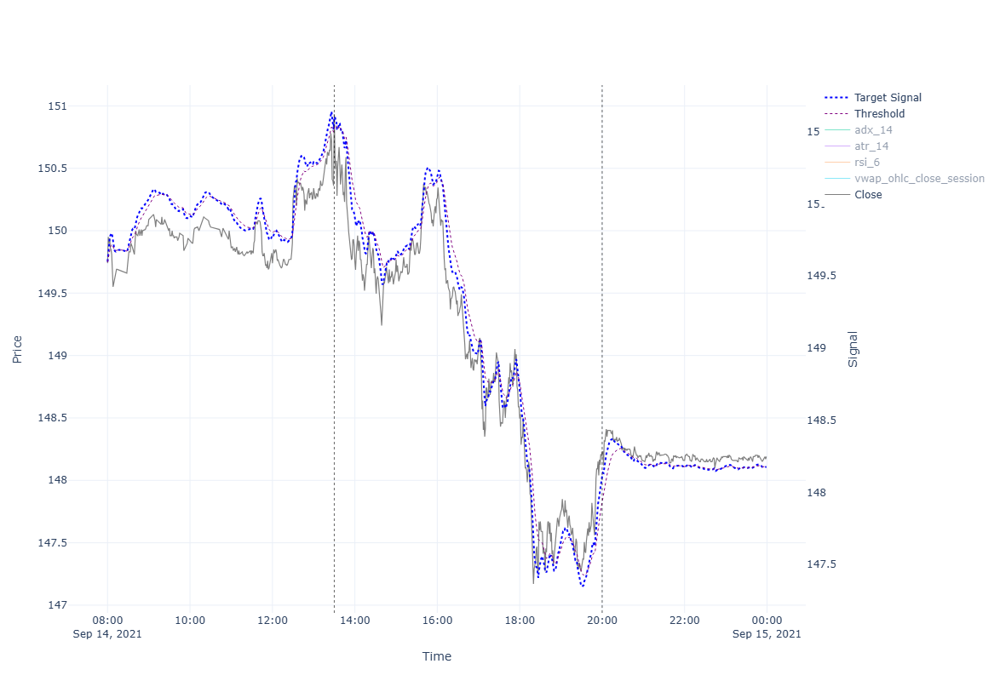


                                                  ******* Performance for 2021-09-14 *******

INTRADAY:
  shares(616); [ask_buy=150.965, fee_buy=0.004, pos_amnt_buy=92996.658]; [bid_sell=148.2, fee_sell=0.017, pos_amnt_sell=91280.726]; leftover=132.161; PNL=-1715.931
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=150.965 end=148.2]; leftover=62.008; total_cap=97270.054; PNL=-826.344




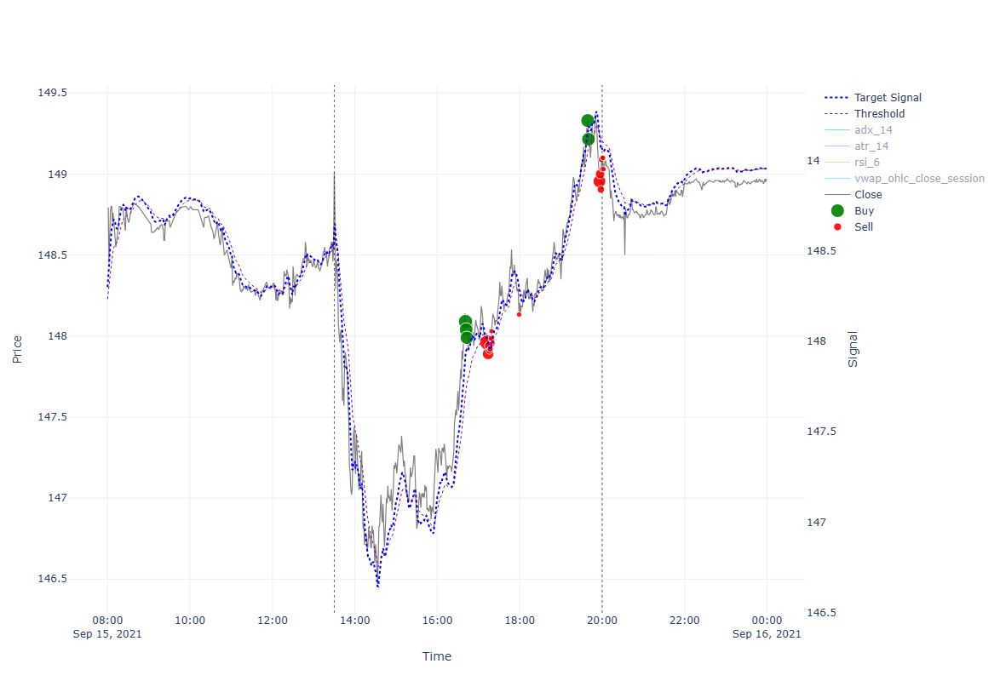


                                                  ******* Performance for 2021-09-15 *******

INTRADAY:
  shares(613); [ask_buy=149.04, fee_buy=0.004, pos_amnt_buy=91363.849]; [bid_sell=149.0, fee_sell=0.017, pos_amnt_sell=91326.443]; leftover=49.038; PNL=-37.406
TRADES:
  Tr[1]: Time(16:41)Ask(148.12)Bid(148.06)Act(Buy)Shrs(35)Pos(35); CashTr(-5184.326)=Cost(-5184.186)-Fee(-0.14); P&L(99028.401)=CashTot(93846.287)+PosAmt(5182.114)
  Tr[2]: Time(16:42)Ask(148.07)Bid(148.011)Act(Buy)Shrs(33)Pos(68); CashTr(-4886.432)=Cost(-4886.3)-Fee(-0.132); P&L(99024.569)=CashTot(88959.855)+PosAmt(10064.714)
  Tr[3]: Time(16:43)Ask(148.019)Bid(147.96)Act(Buy)Shrs(32)Pos(100); CashTr(-4736.736)=Cost(-4736.608)-Fee(-0.128); P&L(99019.099)=CashTot(84223.119)+PosAmt(14795.98)
  Tr[4]: Time(17:13)Ask(147.99)Bid(147.93)Act(Sell)Shrs(45)Pos(55); CashTr(6656.085)=Cost(6656.868)-Fee(-0.783); P&L(99015.376)=CashTot(90879.204)+PosAmt(8136.172)
  Tr[5]: Time(17:14)Ask(147.919)Bid(147.86)Act(Sell)Shrs(25)Pos(30)

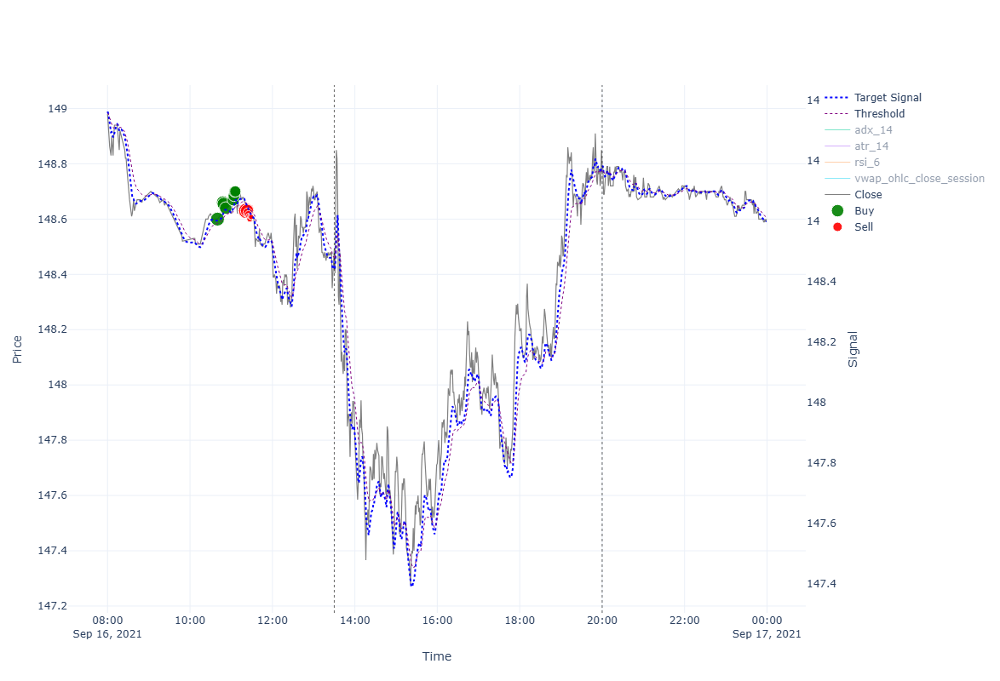


                                                  ******* Performance for 2021-09-16 *******

INTRADAY:
  shares(615); [ask_buy=148.52, fee_buy=0.004, pos_amnt_buy=91342.075]; [bid_sell=148.76, fee_sell=0.017, pos_amnt_sell=91476.812]; leftover=33.406; PNL=134.737
TRADES:
  Tr[1]: Time(10:40)Ask(148.63)Bid(148.57)Act(Buy)Shrs(34)Pos(34); CashTr(-5053.546)=Cost(-5053.41)-Fee(-0.136); P&L(98984.782)=CashTot(93933.392)+PosAmt(5051.39)
  Tr[2]: Time(10:48)Ask(148.69)Bid(148.63)Act(Buy)Shrs(32)Pos(66); CashTr(-4758.198)=Cost(-4758.07)-Fee(-0.128); P&L(98984.793)=CashTot(89175.194)+PosAmt(9809.6)
  Tr[3]: Time(10:49)Ask(148.685)Bid(148.625)Act(Buy)Shrs(31)Pos(97); CashTr(-4609.35)=Cost(-4609.226)-Fee(-0.124); P&L(98982.498)=CashTot(84565.844)+PosAmt(14416.654)
  Tr[4]: Time(10:52)Ask(148.67)Bid(148.61)Act(Buy)Shrs(29)Pos(126); CashTr(-4311.537)=Cost(-4311.421)-Fee(-0.116); P&L(98979.204)=CashTot(80254.307)+PosAmt(18724.898)
  Tr[5]: Time(11:03)Ask(148.7)Bid(148.64)Act(Buy)Shrs(28)Pos(154); 

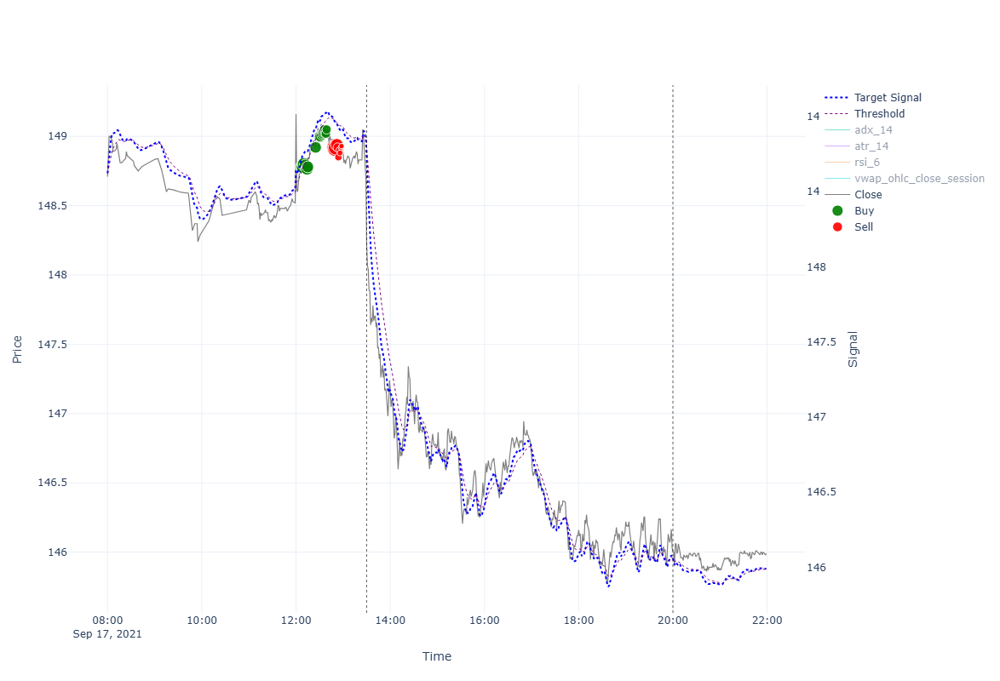


                                                  ******* Performance for 2021-09-17 *******

INTRADAY:
  shares(617); [ask_buy=148.24, fee_buy=0.004, pos_amnt_buy=91466.301]; [bid_sell=145.971, fee_sell=0.017, pos_amnt_sell=90053.278]; leftover=43.917; PNL=-1413.024
TRADES:
  Tr[1]: Time(12:08)Ask(148.81)Bid(148.75)Act(Buy)Shrs(34)Pos(34); CashTr(-5059.669)=Cost(-5059.533)-Fee(-0.136); P&L(98958.785)=CashTot(93901.279)+PosAmt(5057.507)
  Tr[2]: Time(12:09)Ask(148.81)Bid(148.75)Act(Buy)Shrs(33)Pos(67); CashTr(-4910.855)=Cost(-4910.723)-Fee(-0.132); P&L(98956.687)=CashTot(88990.423)+PosAmt(9966.263)
  Tr[3]: Time(12:10)Ask(148.83)Bid(148.77)Act(Buy)Shrs(31)Pos(98); CashTr(-4613.848)=Cost(-4613.724)-Fee(-0.124); P&L(98956.055)=CashTot(84376.575)+PosAmt(14579.48)
  Tr[4]: Time(12:12)Ask(148.82)Bid(148.76)Act(Buy)Shrs(29)Pos(127); CashTr(-4315.89)=Cost(-4315.774)-Fee(-0.116); P&L(98953.231)=CashTot(80060.685)+PosAmt(18892.545)
  Tr[5]: Time(12:14)Ask(148.795)Bid(148.735)Act(Buy)Shrs(28)Po

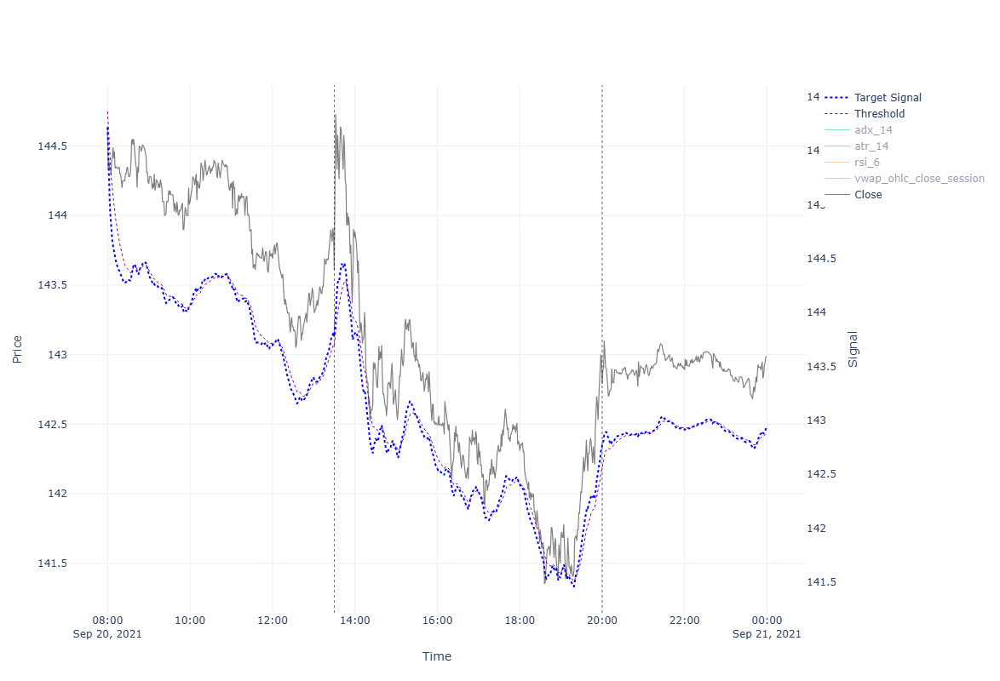


                                                  ******* Performance for 2021-09-20 *******

INTRADAY:
  shares(627); [ask_buy=143.639, fee_buy=0.004, pos_amnt_buy=90063.973]; [bid_sell=142.761, fee_sell=0.017, pos_amnt_sell=89500.564]; leftover=33.222; PNL=-563.409
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=143.639 end=142.761]; leftover=62.008; total_cap=93702.152; PNL=-2105.318




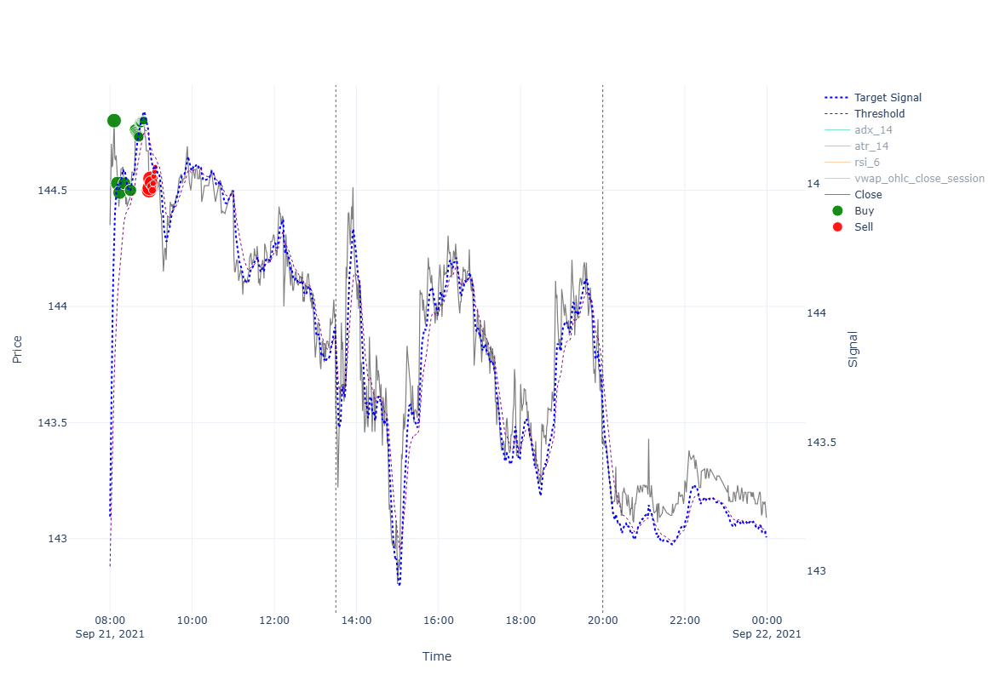


                                                  ******* Performance for 2021-09-21 *******

INTRADAY:
  shares(623); [ask_buy=143.592, fee_buy=0.004, pos_amnt_buy=89460.495]; [bid_sell=143.391, fee_sell=0.017, pos_amnt_sell=89322.007]; leftover=73.291; PNL=-138.488
TRADES:
  Tr[1]: Time(08:06)Ask(144.829)Bid(144.771)Act(Buy)Shrs(37)Pos(37); CashTr(-5358.821)=Cost(-5358.673)-Fee(-0.148); P&L(98933.686)=CashTot(93577.159)+PosAmt(5356.527)
  Tr[2]: Time(08:11)Ask(144.559)Bid(144.501)Act(Buy)Shrs(35)Pos(72); CashTr(-5059.702)=Cost(-5059.561)-Fee(-0.14); P&L(98921.536)=CashTot(88517.457)+PosAmt(10404.079)
  Tr[3]: Time(08:14)Ask(144.519)Bid(144.461)Act(Buy)Shrs(33)Pos(105); CashTr(-4769.256)=Cost(-4769.124)-Fee(-0.132); P&L(98916.617)=CashTot(83748.201)+PosAmt(15168.415)
  Tr[4]: Time(08:21)Ask(144.559)Bid(144.501)Act(Buy)Shrs(30)Pos(135); CashTr(-4336.887)=Cost(-4336.767)-Fee(-0.12); P&L(98918.963)=CashTot(79411.314)+PosAmt(19507.648)
  Tr[5]: Time(08:30)Ask(144.529)Bid(144.471)Act(Buy)

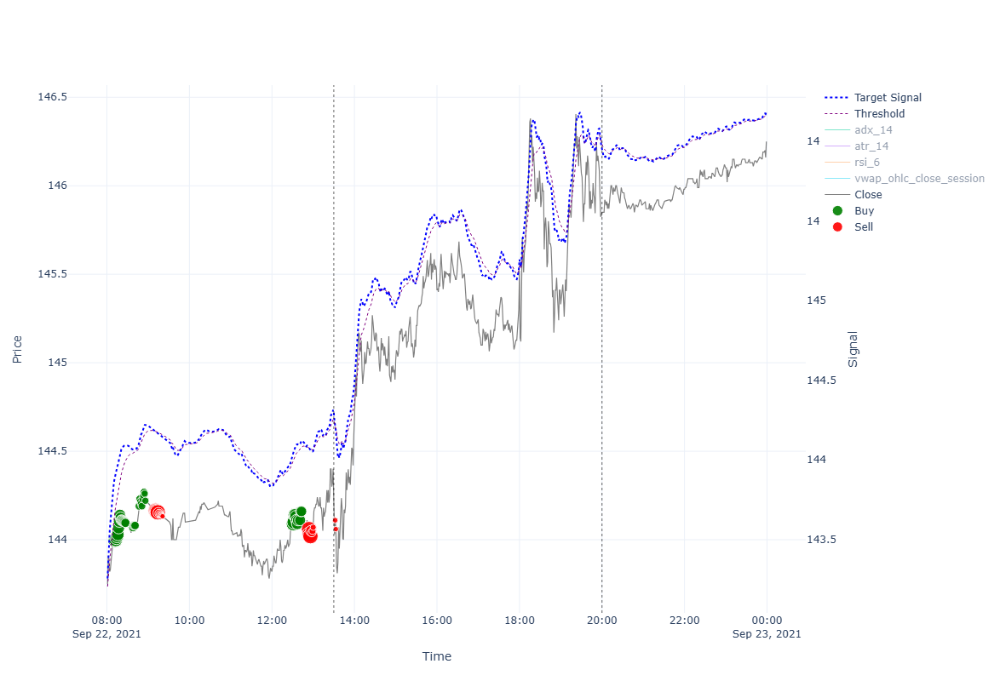


                                                  ******* Performance for 2021-09-22 *******

INTRADAY:
  shares(619); [ask_buy=144.244, fee_buy=0.004, pos_amnt_buy=89289.388]; [bid_sell=145.821, fee_sell=0.017, pos_amnt_sell=90252.337]; leftover=105.91; PNL=962.948
TRADES:
  Tr[1]: Time(08:12)Ask(144.025)Bid(143.968)Act(Buy)Shrs(36)Pos(36); CashTr(-5185.061)=Cost(-5184.917)-Fee(-0.144); P&L(98823.283)=CashTot(93640.439)+PosAmt(5182.843)
  Tr[2]: Time(08:13)Ask(144.029)Bid(143.971)Act(Buy)Shrs(34)Pos(70); CashTr(-4897.115)=Cost(-4896.979)-Fee(-0.136); P&L(98821.308)=CashTot(88743.324)+PosAmt(10077.984)
  Tr[3]: Time(08:14)Ask(144.039)Bid(143.981)Act(Buy)Shrs(32)Pos(102); CashTr(-4609.37)=Cost(-4609.242)-Fee(-0.128); P&L(98820.037)=CashTot(84133.955)+PosAmt(14686.082)
  Tr[4]: Time(08:15)Ask(144.049)Bid(143.991)Act(Buy)Shrs(31)Pos(133); CashTr(-4465.637)=Cost(-4465.513)-Fee(-0.124); P&L(98819.147)=CashTot(79668.318)+PosAmt(19150.83)
  Tr[5]: Time(08:16)Ask(144.059)Bid(144.001)Act(Buy)S

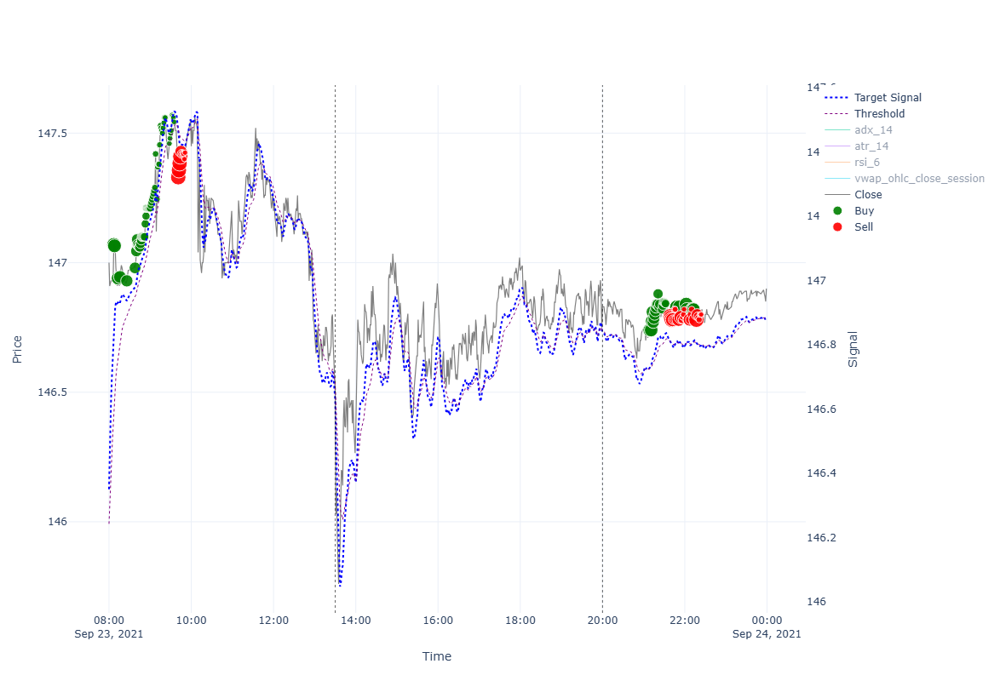


                                                  ******* Performance for 2021-09-23 *******

INTRADAY:
  shares(616); [ask_buy=146.529, fee_buy=0.004, pos_amnt_buy=90264.513]; [bid_sell=146.801, fee_sell=0.017, pos_amnt_sell=90418.469]; leftover=93.733; PNL=153.956
TRADES:
  Tr[1]: Time(08:07)Ask(147.099)Bid(147.041)Act(Buy)Shrs(35)Pos(35); CashTr(-5148.619)=Cost(-5148.479)-Fee(-0.14); P&L(98768.852)=CashTot(93622.431)+PosAmt(5146.421)
  Tr[2]: Time(08:08)Ask(147.094)Bid(147.036)Act(Buy)Shrs(34)Pos(69); CashTr(-5001.346)=Cost(-5001.21)-Fee(-0.136); P&L(98766.542)=CashTot(88621.086)+PosAmt(10145.456)
  Tr[3]: Time(08:13)Ask(146.969)Bid(146.911)Act(Buy)Shrs(32)Pos(101); CashTr(-4703.149)=Cost(-4703.021)-Fee(-0.128); P&L(98755.907)=CashTot(83917.937)+PosAmt(14837.971)
  Tr[4]: Time(08:16)Ask(146.974)Bid(146.916)Act(Buy)Shrs(30)Pos(131); CashTr(-4409.352)=Cost(-4409.232)-Fee(-0.12); P&L(98754.528)=CashTot(79508.585)+PosAmt(19245.944)
  Tr[5]: Time(08:26)Ask(146.959)Bid(146.901)Act(Buy)Sh

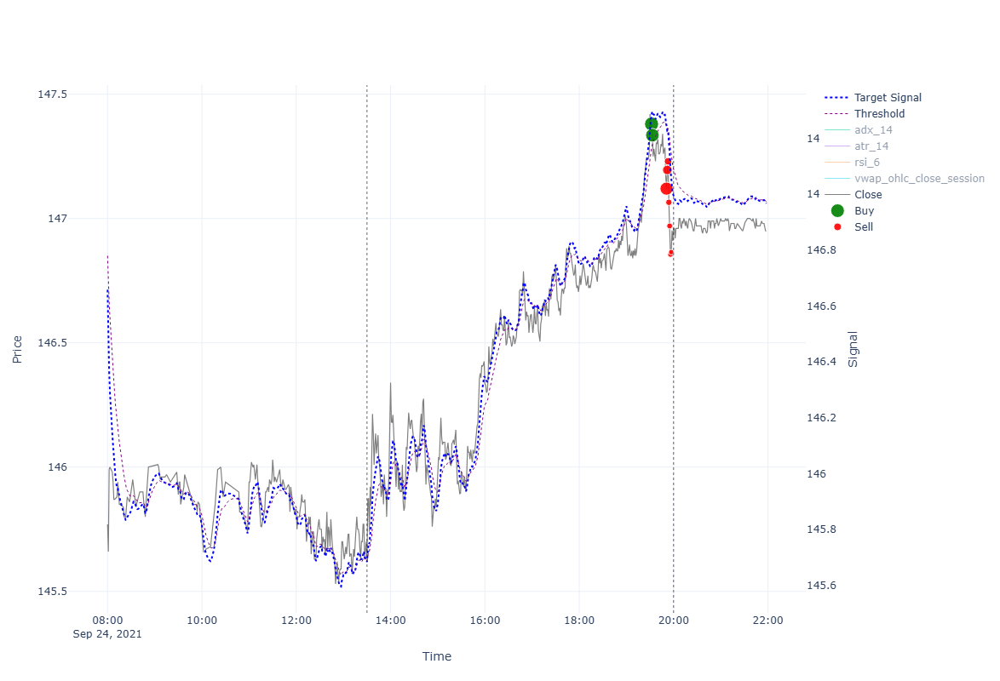


                                                  ******* Performance for 2021-09-24 *******

INTRADAY:
  shares(621); [ask_buy=145.66, fee_buy=0.004, pos_amnt_buy=90457.406]; [bid_sell=146.931, fee_sell=0.017, pos_amnt_sell=91233.114]; leftover=54.797; PNL=775.707
TRADES:
  Tr[1]: Time(19:32)Ask(147.41)Bid(147.351)Act(Buy)Shrs(35)Pos(35); CashTr(-5159.473)=Cost(-5159.333)-Fee(-0.14); P&L(98789.1)=CashTot(93631.833)+PosAmt(5157.267)
  Tr[2]: Time(19:33)Ask(147.364)Bid(147.305)Act(Buy)Shrs(33)Pos(68); CashTr(-4863.16)=Cost(-4863.028)-Fee(-0.132); P&L(98785.446)=CashTot(88768.672)+PosAmt(10016.774)
  Tr[3]: Time(19:51)Ask(147.149)Bid(147.091)Act(Sell)Shrs(31)Pos(37); CashTr(4559.27)=Cost(4559.809)-Fee(-0.539); P&L(98770.294)=CashTot(93327.942)+PosAmt(5442.352)
  Tr[4]: Time(19:52)Ask(147.225)Bid(147.166)Act(Sell)Shrs(17)Pos(20); CashTr(2501.525)=Cost(2501.82)-Fee(-0.295); P&L(98772.785)=CashTot(95829.467)+PosAmt(2943.318)
  Tr[5]: Time(19:53)Ask(147.259)Bid(147.201)Act(Sell)Shrs(9)Pos(1

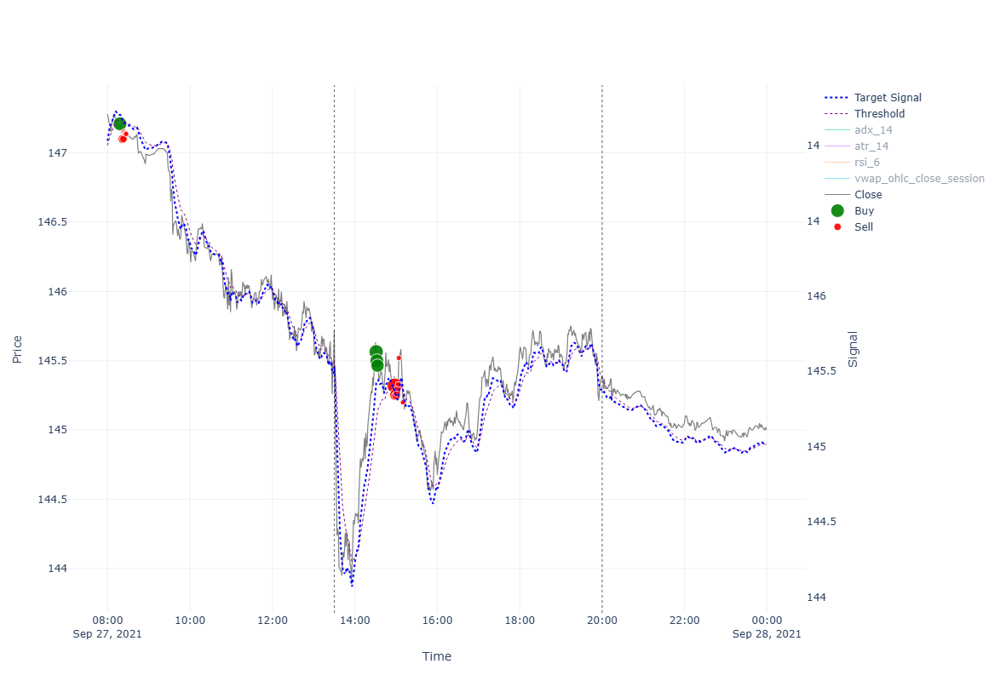


                                                  ******* Performance for 2021-09-27 *******

INTRADAY:
  shares(626); [ask_buy=145.749, fee_buy=0.004, pos_amnt_buy=91241.441]; [bid_sell=145.361, fee_sell=0.017, pos_amnt_sell=90985.07]; leftover=46.469; PNL=-256.371
TRADES:
  Tr[1]: Time(08:18)Ask(147.239)Bid(147.181)Act(Buy)Shrs(34)Pos(34); CashTr(-5006.276)=Cost(-5006.14)-Fee(-0.136); P&L(98768.276)=CashTot(93764.136)+PosAmt(5004.14)
  Tr[2]: Time(08:22)Ask(147.129)Bid(147.071)Act(Sell)Shrs(16)Pos(18); CashTr(2352.852)=Cost(2353.13)-Fee(-0.278); P&L(98764.258)=CashTot(96116.987)+PosAmt(2647.271)
  Tr[3]: Time(08:23)Ask(147.129)Bid(147.071)Act(Sell)Shrs(9)Pos(9); CashTr(1323.479)=Cost(1323.635)-Fee(-0.156); P&L(98764.102)=CashTot(97440.466)+PosAmt(1323.635)
  Tr[4]: Time(08:24)Ask(147.179)Bid(147.121)Act(Sell)Shrs(5)Pos(4); CashTr(735.516)=Cost(735.603)-Fee(-0.087); P&L(98764.465)=CashTot(98175.982)+PosAmt(588.482)
  Tr[5]: Time(08:25)Ask(147.175)Bid(147.116)Act(Sell)Shrs(2)Pos(2); C

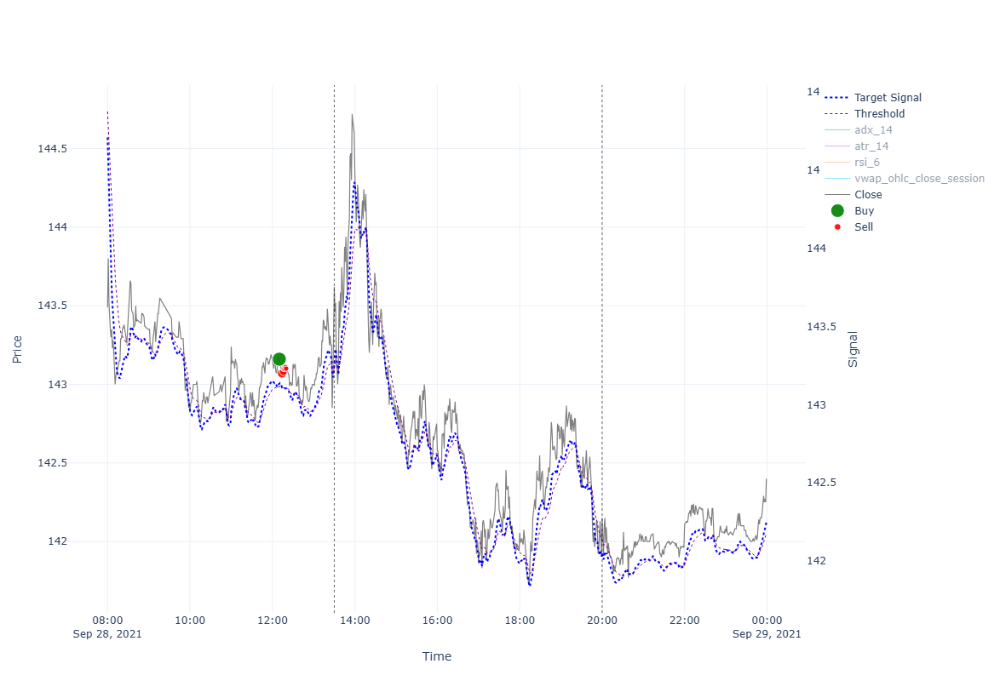


                                                  ******* Performance for 2021-09-28 *******

INTRADAY:
  shares(633); [ask_buy=143.649, fee_buy=0.004, pos_amnt_buy=90932.159]; [bid_sell=142.122, fee_sell=0.017, pos_amnt_sell=89952.045]; leftover=99.38; PNL=-980.114
TRADES:
  Tr[1]: Time(12:10)Ask(143.189)Bid(143.131)Act(Buy)Shrs(35)Pos(35); CashTr(-5011.741)=Cost(-5011.601)-Fee(-0.14); P&L(98731.535)=CashTot(93721.936)+PosAmt(5009.599)
  Tr[2]: Time(12:14)Ask(143.099)Bid(143.041)Act(Sell)Shrs(16)Pos(19); CashTr(2288.386)=Cost(2288.662)-Fee(-0.277); P&L(98728.109)=CashTot(96010.322)+PosAmt(2717.787)
  Tr[3]: Time(12:16)Ask(143.109)Bid(143.051)Act(Sell)Shrs(9)Pos(10); CashTr(1287.307)=Cost(1287.463)-Fee(-0.156); P&L(98728.143)=CashTot(97297.629)+PosAmt(1430.514)
  Tr[4]: Time(12:17)Ask(143.129)Bid(143.071)Act(Sell)Shrs(5)Pos(5); CashTr(715.271)=Cost(715.357)-Fee(-0.086); P&L(98728.257)=CashTot(98012.9)+PosAmt(715.357)
  Tr[5]: Time(12:18)Ask(143.129)Bid(143.071)Act(Sell)Shrs(3)Pos(2); 

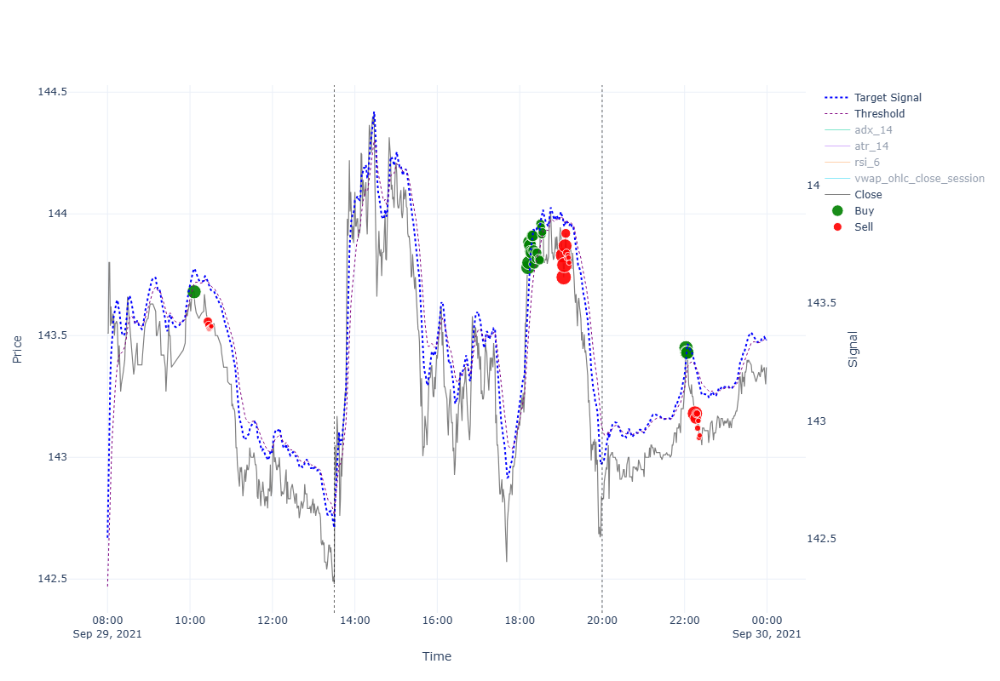


                                                  ******* Performance for 2021-09-29 *******

INTRADAY:
  shares(631); [ask_buy=142.508, fee_buy=0.004, pos_amnt_buy=89925.387]; [bid_sell=142.801, fee_sell=0.017, pos_amnt_sell=90096.78]; leftover=126.038; PNL=171.393
TRADES:
  Tr[1]: Time(10:06)Ask(143.709)Bid(143.651)Act(Buy)Shrs(35)Pos(35); CashTr(-5029.945)=Cost(-5029.805)-Fee(-0.14); P&L(98726.031)=CashTot(93698.236)+PosAmt(5027.796)
  Tr[2]: Time(10:26)Ask(143.587)Bid(143.529)Act(Sell)Shrs(16)Pos(19); CashTr(2296.192)=Cost(2296.469)-Fee(-0.277); P&L(98721.485)=CashTot(95994.428)+PosAmt(2727.057)
  Tr[3]: Time(10:27)Ask(143.573)Bid(143.515)Act(Sell)Shrs(9)Pos(10); CashTr(1291.482)=Cost(1291.638)-Fee(-0.156); P&L(98721.063)=CashTot(97285.91)+PosAmt(1435.153)
  Tr[4]: Time(10:28)Ask(143.559)Bid(143.501)Act(Sell)Shrs(5)Pos(5); CashTr(717.42)=Cost(717.506)-Fee(-0.086); P&L(98720.836)=CashTot(98003.33)+PosAmt(717.506)
  Tr[5]: Time(10:29)Ask(143.562)Bid(143.504)Act(Sell)Shrs(3)Pos(2); C

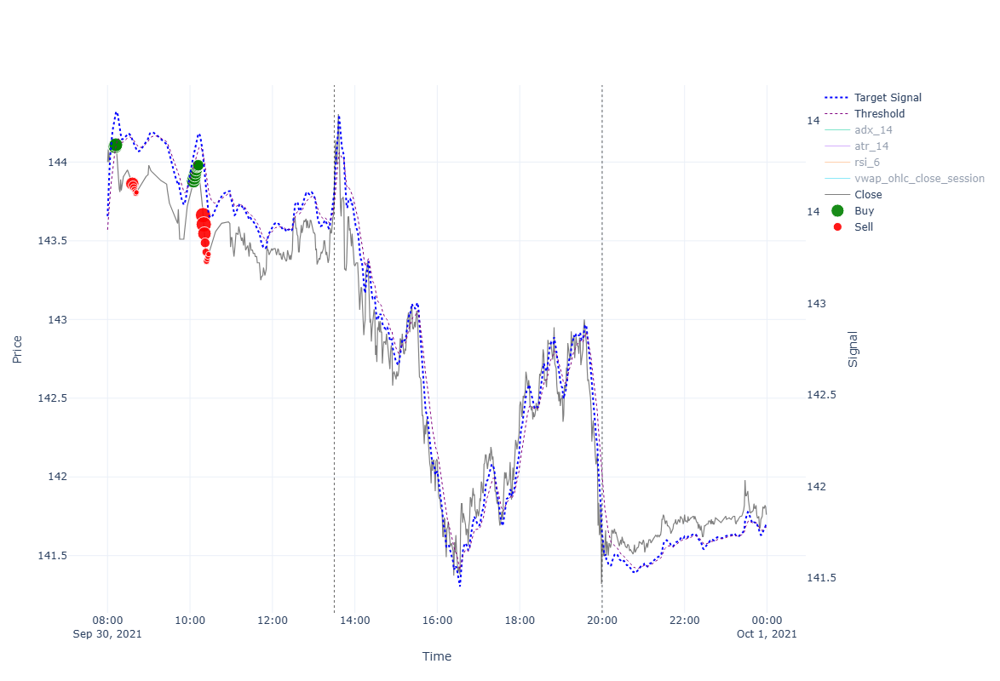


                                                  ******* Performance for 2021-09-30 *******

INTRADAY:
  shares(627); [ask_buy=143.809, fee_buy=0.004, pos_amnt_buy=90170.626]; [bid_sell=141.532, fee_sell=0.017, pos_amnt_sell=88729.56]; leftover=52.192; PNL=-1441.065
TRADES:
  Tr[1]: Time(08:11)Ask(144.129)Bid(144.071)Act(Buy)Shrs(36)Pos(36); CashTr(-5188.781)=Cost(-5188.637)-Fee(-0.144); P&L(98628.614)=CashTot(93442.051)+PosAmt(5186.563)
  Tr[2]: Time(08:12)Ask(144.139)Bid(144.081)Act(Buy)Shrs(34)Pos(70); CashTr(-4900.855)=Cost(-4900.719)-Fee(-0.136); P&L(98626.879)=CashTot(88541.195)+PosAmt(10085.684)
  Tr[3]: Time(08:36)Ask(143.891)Bid(143.834)Act(Sell)Shrs(32)Pos(38); CashTr(4602.125)=Cost(4602.678)-Fee(-0.554); P&L(98609.001)=CashTot(93143.32)+PosAmt(5465.681)
  Tr[4]: Time(08:37)Ask(143.879)Bid(143.821)Act(Sell)Shrs(17)Pos(21); CashTr(2444.666)=Cost(2444.96)-Fee(-0.294); P&L(98608.232)=CashTot(95587.986)+PosAmt(3020.245)
  Tr[5]: Time(08:38)Ask(143.866)Bid(143.809)Act(Sell)Shrs(

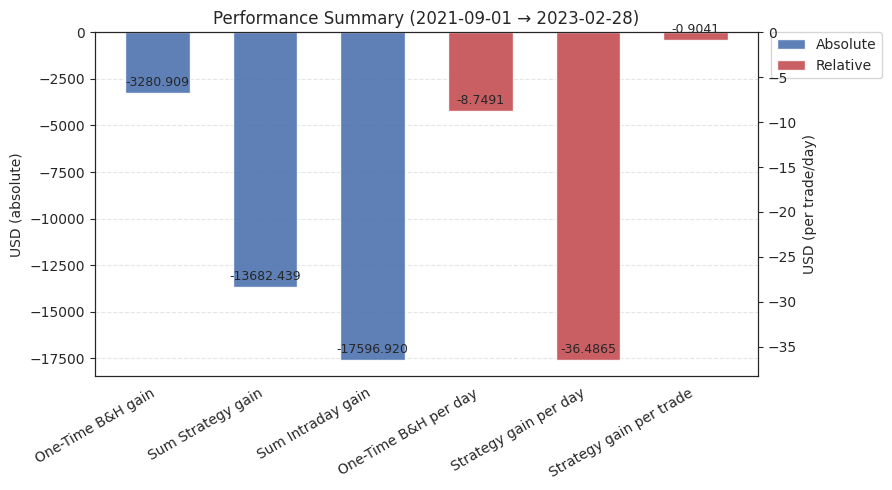

Rolling monthly summary (each metric carries its own capital forward):

Monthly Summary 2021-09 (2021-09-01 = 152.340 → 2021-09-30 = 141.732)
Num. trading days: 21  Trades Count: 933
One-Time B&H gain: -7104.511 | start: 100000.000 | final: 92895.489 | PnL%: -7.10%
Sum Strategy gain: -1491.853 | start: 100000.000 | final: 98508.147 | PnL%: -1.49%
Sum Intraday gain: -11218.248 | start: 100000.000 | final: 88781.752 | PnL%: -11.22%

Monthly Summary 2021-10 (2021-10-01 = 141.732 → 2021-10-29 = 149.870)
Num. trading days: 21  Trades Count: 1011
One-Time B&H gain: 5404.200 | start: 92895.489 | final: 98299.689 | PnL%: 5.82%
Sum Strategy gain: -156.600 | start: 98508.147 | final: 98351.547 | PnL%: -0.16%
Sum Intraday gain: 5044.927 | start: 88781.752 | final: 93826.679 | PnL%: 5.68%

Monthly Summary 2021-11 (2021-11-01 = 149.870 → 2021-11-30 = 166.317)
Num. trading days: 21  Trades Count: 901
One-Time B&H gain: 10303.492 | start: 98299.689 | final: 108603.181 | PnL%: 10.48%
Sum Strategy gain

In [5]:
# importlib.reload(params) ######
importlib.reload(strats) ######
# importlib.reload(plots) ######

year, month = map(int, params.month_to_check.split("-"))
dates_in_month = [date for date in sim_results if date.year == year and date.month == month]

if not dates_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for date in sorted(dates_in_month):
        df_at_date_plot, trades_at_date, stats_at_date = sim_results[date]
        plots.plot_trades(
            df                 = df_at_date_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            features           = [params.col_atr_tick, params.col_adx_tick, params.col_rsi_tick, params.col_vwap_tick],
            autoscale          = False
        )
        
        print(f"\n{' ' * 50}******* Performance for {date.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_at_date.items(): # Print stats dict for each date nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "="*160 + "\n")

# final visualizations and monthly aggregations
strats.aggregate_performance(df = df,
                             sim_results = sim_results)


In [12]:
# propose adjusted parameters ranges for next optuna run
from libs import opts
new_ranges = opts.propose_ranges_from_top(
    csv_path="optuna_results/AAPL_2.1854_predicted.csv",
    top_n=100,
    spread=3,
    agg="median",
    cat_top_k=3,
)

new_ranges

{'reset_peak': (0, 0),
 'rsi_min_thresh': (-21, 46),
 'rsi_max_thresh': (52, 70),
 'adx_thresh': (52.67621822832739, 56.0248317716726),
 'atr_mult': (-2.0498311120899015, 2.6642511120899015),
 'vwap_atr_mult': (-0.11750509317562963, 3.98585509317563),
 'buy_factor': (0.03765821239762325, 0.08835178760237676),
 'sell_factor': (-0.1877547152377519, 0.4936647152377519),
 'trailstop_pct': (15.787678025363743, 34.36573197463626),
 'sign_thresh_pair': {'categorical': ['ema_9|ema_21']}}